In [1]:
import sys
sys.path.append("../")

In [2]:
import os 
import glob
import cv2
import matplotlib.pyplot as plt
%matplotlib inline 
import numpy as np
import importlib
import random
import time
from datetime import datetime
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras.optimizers.schedules import PiecewiseConstantDecay
from tensorflow.keras.layers import Add, Conv2D, Input, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras import backend as K

import tensorflow as tf
from tensorflow.python.client import device_lib
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
from tensorflow.compat.v1 import Session
from tensorflow.compat.v1 import get_default_graph

from RESUNET import data_generator as data_generator
from RESUNET import config as config
from EDSR import utils as utils
from EDSR import losses as losses
from RESUNET import models as models
from EDSR import lr_finder as lr_finder
from EDSR import custom_callbacks as custom_callbacks 

seed = 2020
os.environ['PYTHONHASHSEED'] = '0'                      
np.random.seed(seed)
random.seed(seed)
tf.random.set_seed(seed)

session_conf = ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
sess = Session(graph=get_default_graph(), config=session_conf)
tf.compat.v1.keras.backend.set_session(sess)


In [3]:
importlib.reload(utils)
importlib.reload(data_generator)
importlib.reload(models)
importlib.reload(losses)
 

<module 'EDSR.losses' from '../EDSR/losses.py'>

In [4]:

crop_size = config.CROP_SIZE
img_path = config.DATA_PATH
batch_size = config.BATCH_SIZE
scale = config.SCALE
epochs = config.EPOCHS
model_name=config.MODEL_NAME


img_path_list = sorted(glob.glob(os.path.join(img_path, '*.jpg')))
test_size = 0.2
img_path_idx = np.arange(len(img_path_list))
train_img_path, val_img_path, train_img_idx, val_img_idx = train_test_split(img_path_list, img_path_idx, \
                                                                            test_size=test_size, random_state=2020)
print(len(train_img_idx), len(val_img_idx))  


5912 1478


### train decoder only with both MAE and perceptual loss from the beginning

In [6]:
importlib.reload(data_generator)

flip = False
crop = True
keep_dim = True
multi_losses = True

train_gen = data_generator.DataGenerator(img_path_list=train_img_path, crop_size=crop_size, 
                                         batch_size=batch_size, scale=scale, shuffle=True, 
                                         keep_dim=keep_dim, crop=crop, flip=flip,
                                         multi_losses=multi_losses)

val_gen = data_generator.DataGenerator(img_path_list=val_img_path, crop_size=crop_size,
                                       batch_size=batch_size, scale=scale, shuffle=True,
                                       keep_dim=keep_dim, crop=crop, flip=flip,
                                       multi_losses=multi_losses)


In [2]:

# [batch_lr_img, batch_hr_img], _ = next(iter(train_gen))
# print(batch_lr_img.shape, batch_hr_img.shape)

# show_num = 3
# for i in range(len(batch_hr_img[:show_num])):
#     utils.show_batch_imgs(idx=i, demo_ori_img=batch_hr_img[:show_num], demo_lr_img=batch_lr_img[:show_num])



In [17]:
importlib.reload(models)


resnet34_weight = 'resnet34_imagenet_1000_no_top.h5'
resunet = models.ResUNet(input_shape=(None, None, 3), encoder_weights=resnet34_weight, classes=3,
                         decoder_block_type='upsampling', batchnorm=True, encoder_freeze=True)

model = models.build_multiloss_model(trainable_model=resunet)
multi_losses = ['unet', 'Content']
weights = [1., 1.]

 
opt = Adam(learning_rate=PiecewiseConstantDecay(boundaries=[len(train_gen)*10, len(train_gen)*20], 
                                                values=[1e-3, 5e-4, 1e-5]))

model.compile(optimizer=opt, loss = {loss : 'mae' for loss in multi_losses}, 
              loss_weights = weights, metrics={'unet' : losses.SSIM})
 

model.summary()

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
LR (InputLayer)                 [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
unet (Model)                    multiple             24457436    LR[0][0]                         
__________________________________________________________________________________________________
HR (InputLayer)                 [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
VGG16 (Model)                   [(None, 32, 32, 256) 12354880    HR[0][0]                         
                                                                 unet[1][0]                 

In [18]:

checkpoint = ModelCheckpoint(filepath = '{}{}_128_crop_upsample2D.h5'.format(model_name, scale), 
                               save_best_only=True, save_weights_only=True,
                               monitor = 'val_loss')


log_filename = datetime.now().strftime("%Y-%m-%d_%H:%M:%S") + '{}{}_128_crop_upsample2D.log'.format(model_name, scale)
log_path = os.path.join('/work/logs', log_filename) 
csv_logger = CSVLogger(log_path, separator=',', append=False)

callbacks_list = [checkpoint, csv_logger]
model.fit(train_gen, validation_data=val_gen, callbacks=callbacks_list, epochs=epochs)


Train for 185 steps, validate for 47 steps
Epoch 1/30
185/185 [==============================] - 53s 285ms/step - loss: 1.8099 - unet_loss: 0.1506 - Content_loss: 1.6593 - unet_SSIM: 0.5999 - val_loss: 3.3710 - val_unet_loss: 0.2933 - val_Content_loss: 3.0777 - val_unet_SSIM: 0.2899
Epoch 2/30
185/185 [==============================] - 39s 213ms/step - loss: 1.0261 - unet_loss: 0.0610 - Content_loss: 0.9652 - unet_SSIM: 0.7667 - val_loss: 3.2753 - val_unet_loss: 0.2209 - val_Content_loss: 3.0544 - val_unet_SSIM: 0.3617
Epoch 3/30
185/185 [==============================] - 40s 214ms/step - loss: 0.9574 - unet_loss: 0.0567 - Content_loss: 0.9007 - unet_SSIM: 0.7794 - val_loss: 3.1903 - val_unet_loss: 0.2141 - val_Content_loss: 2.9762 - val_unet_SSIM: 0.3951
Epoch 4/30
185/185 [==============================] - 40s 215ms/step - loss: 0.8762 - unet_loss: 0.0511 - Content_loss: 0.8251 - unet_SSIM: 0.7930 - val_loss: 2.9085 - val_unet_loss: 0.1953 - val_Content_loss: 2.7132 - val_unet_SSIM: 

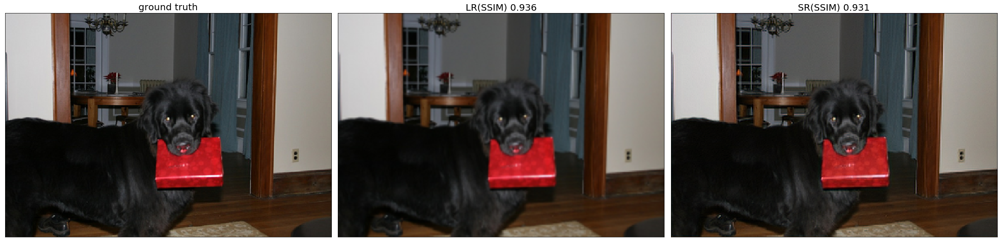

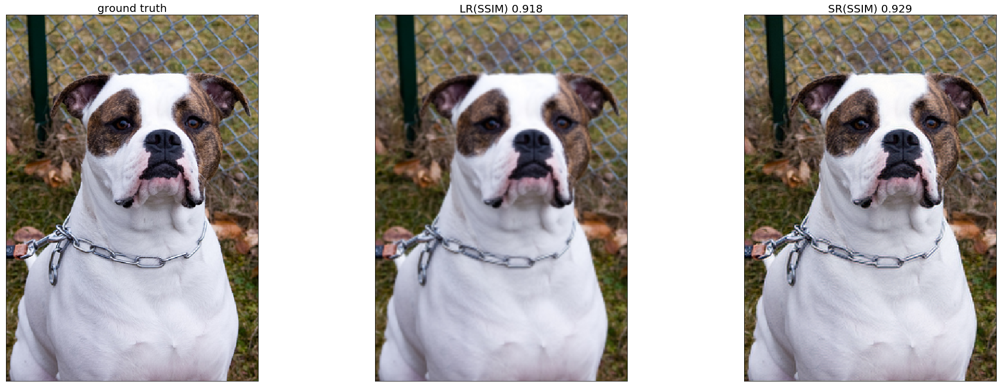

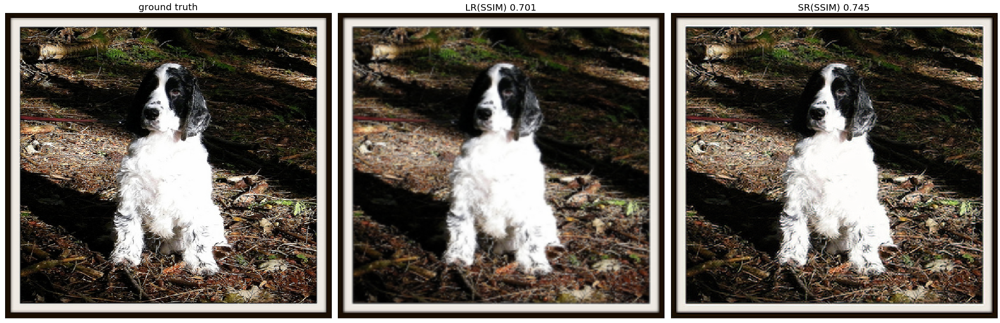

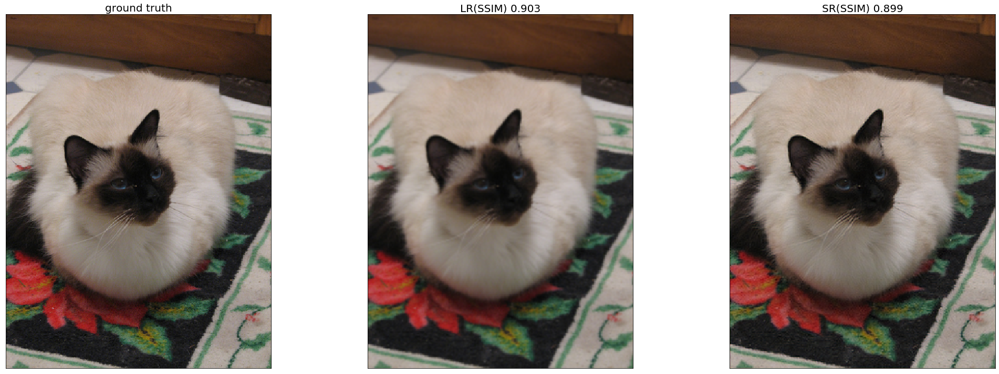

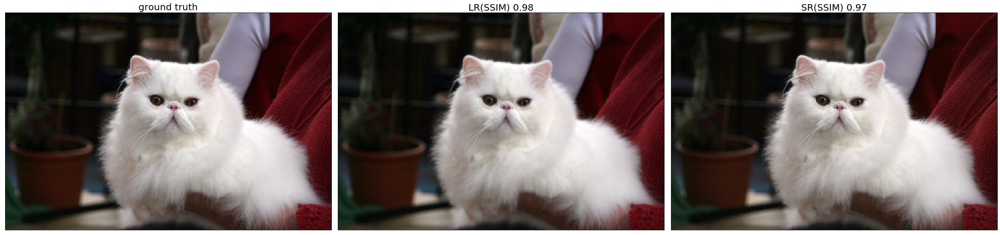

In [22]:
importlib.reload(utils)

resunet.save_weights('{}{}_128_crop_upsample2D.h5'.format(model_name, scale))
resunet = models.ResUNet(input_shape=(None, None, 3), encoder_weights=resnet34_weight, classes=3,
                         decoder_block_type='upsampling', batchnorm=True, encoder_freeze=True)

resunet.load_weights('{}{}_128_crop_upsample2D.h5'.format(model_name, scale))

utils.predict_and_show(val_img_path[:5], resunet, 2, keep_dim = True, multi_255 = True)


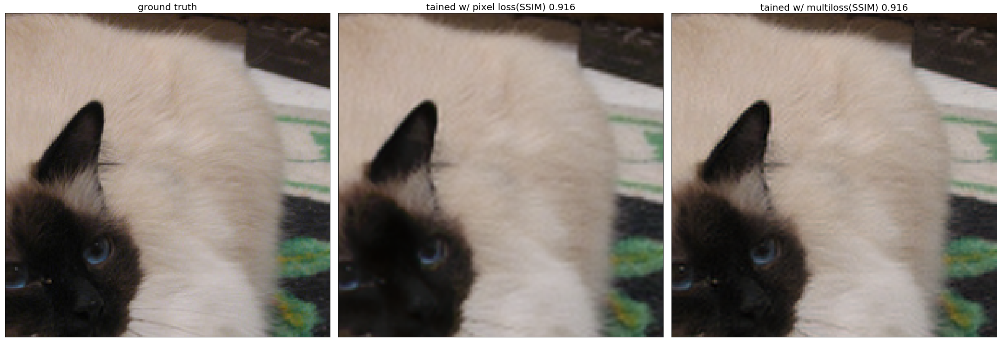

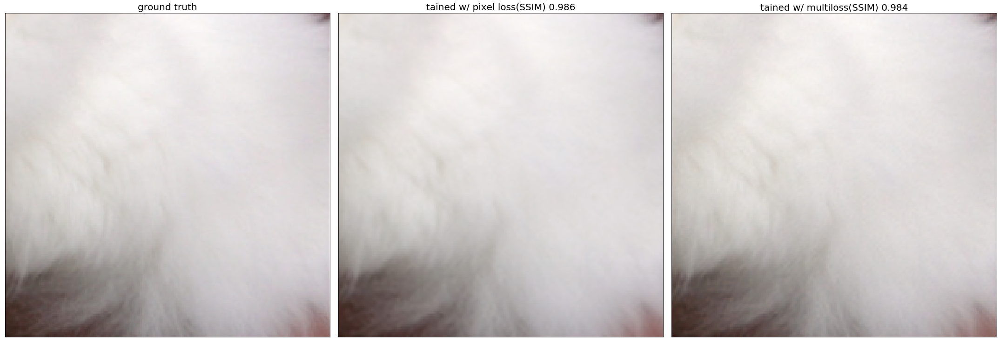

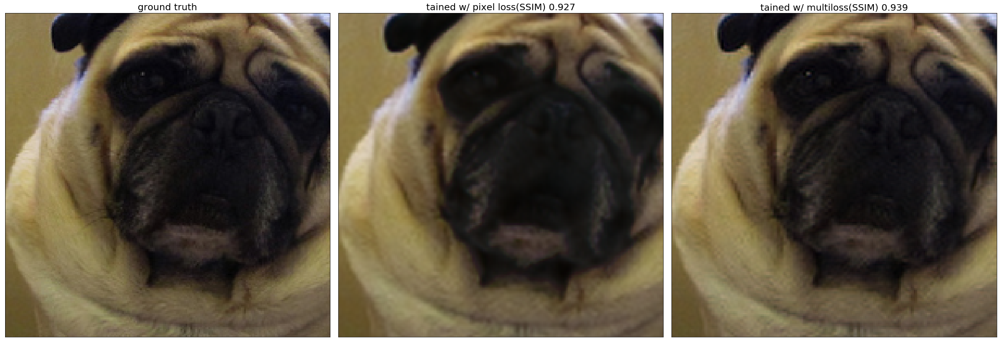

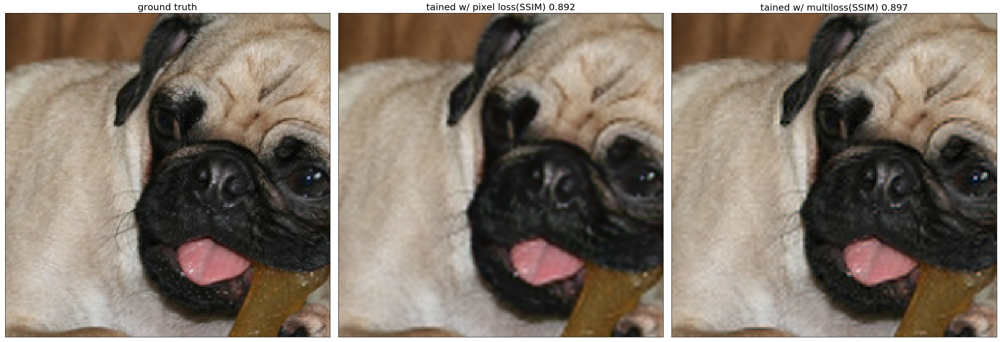

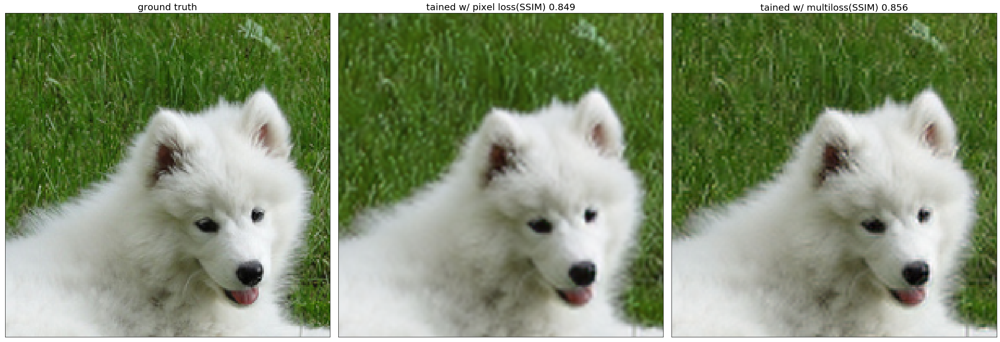

In [25]:
importlib.reload(utils)

# trained only the decoder with MAE loss alone
model1 =  models.ResUNet(input_shape=(None, None, 3), encoder_weights=resnet34_weight, classes=3,
                         decoder_block_type='upsampling', batchnorm=True, encoder_freeze=True)

model1.load_weights('../model/ResUnet_MAE_lr_batch32.h5')

# trained only the decoder (subpixel upsampling) with MAE and perceptual loss 
model2 = models.ResUNet(input_shape=(None, None, 3), encoder_weights=resnet34_weight, classes=3,
                         decoder_block_type='upsampling', batchnorm=True, encoder_freeze=True)


# counterpart trained with crop size 96: resunet_multilosses
model2.load_weights('{}{}_128_crop_upsample2D.h5'.format(model_name, scale))

utils.compare_two_models(val_img_path[3:8], model1, model2, scale, keep_dim=True, 
                         show_ori_img=True, multi_255=True, show_patch=True)
